<a href="https://colab.research.google.com/github/shannondill/GEOG5990M/blob/main/201896295_GEOG5990M_Final_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# GEOG5990M Final Assignment

Student ID number: 201896295

## Research aims:
Does distance travelled to work affect bicycle use for mode of transport?

Are there any other factors influencing the use of a bicycle to travel to work?

# Import packages

In [1]:
#Pip installs
! pip install contextily
! pip install geoplot
! pip install git+https://github.com/pmdscully/geo_northarrow.git
! pip install patool
! pip install mapclassify
! pip install geopandas fiona
! pip install matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 61.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.7/11.7 MB 19.7 MB/s eta 0:00:00
  Cloning https://github.com/pmdscully/geo_northarrow.git to /tmp/pip-req-build-u7k8npaj
  Running command git clone --filter=blob:none --quiet https://github.com/pmdscully/geo_northarrow.git /tmp/pip-req-build-u7k8npaj
  Resolved https://github.com/pmdscully/geo_northarrow.git to commit 963bdd271707a3bcaa47b2d83d92b88ae0b10950
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for geo_northarrow: filename=geo_northarrow-0.2.0a0-py3-none-any.whl size=14723 sha256=a9d6a488556f7155381fb437c1a4add9292cb3510903478467cc8526ea6795a9
  Stored in directory: /tmp/pip-ephem-wheel-cache-e4lsm7lc/wheels/6a/22/96/2e5d1215f457d6b69b44cbaa1a0d3b822bc656dcabcda80095
Succe

In [2]:
# import required packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from scipy import stats
import numpy as np

import geoplot as gplt
import geoplot.crs as gcrs
from geo_northarrow import add_north_arrow
import contextily as ctx
import patoolib
import glob
import os

# import machine learning packages
from sklearn import cluster
from sklearn.preprocessing import scale

# set seaborn plotting theme to white
sns.set_theme(style="white")


# Importing data sets

## Spatial Data Imports

In [3]:
# LSOA leeds [1]

shp = gpd.read_file('/content/LSOADecember_2021_Boundaries_EW_BFC_(V10).geojson')

# subset Leeds from geojson only
leeds_shp = shp.loc[shp['LSOA21NM'].str.contains('Leeds'),:]
# new Leeds only LSOA dataset - Leeds shape file
leeds_shp.to_file('Leeds.geojson')


Exploring the LSOA boundary data ensures that the upload worked properly and to gain a better understanding of the study area.

In [ ]:
leeds_shp.explore()

In [4]:
# read in Leeds shape file
leeds_lsoa = gpd.read_file('/content/Leeds.geojson')
# make column names lower case
leeds_lsoa.columns = leeds_lsoa.columns.str.lower()

# Ensure it is saved as a GeoDataFrame (to make use of the geometry)
leeds_lsoa = gpd.GeoDataFrame(leeds_lsoa)

# check table has been updated
leeds_lsoa.head()

,fid,lsoa21cd,lsoa21nm,lsoa21nmw,bng_e,bng_n,lat,long,shape__area,shape__length,globalid,geometry
0,10720,E01011264,Leeds 011A,,420937,441836,53.87233,-1.68306,6.373247e+05,5076.727907,e4ed2f01-7253-4c5a-ba48-c2778526dc67,"POLYGON ((-1.67829 53.87663, -1.67775 53.87654..."
1,10721,E01011265,Leeds 009A,,418988,441951,53.87343,-1.71270,5.273672e+05,7553.237963,4d252abf-180d-4c24-ae8f-3932dd433d0f,"POLYGON ((-1.71803 53.87891, -1.71799 53.87886..."
2,10722,E01011266,Leeds 008A,,417489,442615,53.87945,-1.73546,2.531467e+06,8353.989324,66191f73-111e-4f37-ba33-42666730927f,"POLYGON ((-1.73093 53.88634, -1.73085 53.88633..."
3,10723,E01011267,Leeds 009B,,419641,442025,53.87408,-1.70276,4.491912e+05,3774.393194,85e5e657-9d57-4a48-aa5f-61fdc02cd326,"POLYGON ((-1.70324 53.87734, -1.70317 53.87675..."
4,10724,E01011268,Leeds 010A,,420224,441935,53.87324,-1.69390,3.949483e+05,4362.834372,58280f14-db59-4eee-875a-44d3c04026d8,"POLYGON ((-1.69055 53.87774, -1.69053 53.87759..."


In [5]:
# Method used to travel to work [2]
travel = gpd.read_file('/content/leeds_travel_to_work_mode_distance.geojson.txt')
# make column names lower case
travel.columns = travel.columns.str.lower()
# check table has been updated
travel.head()

,fid,lsoa21cd,lsoa21nm,wd24nm,bng_e,bng_n,long,lat,total_distance_to_work,less than 10km,...,"bus, minibus or coach",taxi,"motorcycle, scooter or moped",driving a car or van,passenger in a car or van,bicycle,on foot,other method of travel to work,not in employment or aged 15 years and under,geometry
0,10720,E01011264,Leeds 011A,Otley & Yeadon,420937,441836,-1.68306,53.87232,1284,200,...,25,2,1,312,23,5,45,6,703,"POLYGON ((421248.688 442315.812, 421284.072 44..."
1,10721,E01011265,Leeds 009A,Guiseley & Rawdon,418988,441951,-1.71269,53.87343,1953,240,...,17,4,2,335,23,11,72,10,998,"POLYGON ((418635 442559, 418637.555 442552.869..."
2,10722,E01011266,Leeds 008A,Guiseley & Rawdon,417489,442615,-1.73545,53.87945,2617,356,...,13,7,0,603,24,9,60,7,1174,"POLYGON ((417783.688 443382.312, 417788.688 44..."
3,10723,E01011267,Leeds 009B,Guiseley & Rawdon,419641,442025,-1.70276,53.87407,1701,269,...,15,8,3,373,21,8,87,3,937,"POLYGON ((419607.843 442388.568, 419612.752 44..."
4,10724,E01011268,Leeds 010A,Otley & Yeadon,420224,441935,-1.69390,53.87324,1401,278,...,35,8,1,316,36,10,99,2,757,"POLYGON ((420442.406 442436.687, 420443.313 44..."


### Spatial Data Cleaning

Check coordinate reference system (crs) for the LSOA data:



In [6]:
# check crs
leeds_lsoa.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The above crs is not UK specific.  It must be changed to the British National Grid system; EPSG:27700

In [7]:
# update crs
leeds_lsoa= leeds_lsoa.to_crs(epsg=27700)
# check crs
leeds_lsoa.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

Table join 'leeds_lsoa' file with 'travel' data to make use of the geometry.  This is achieved through a left-table join, using both lsoa21cd codes to merge them seamlessly together.

In [8]:
# table join leeds_lsoa and travel datasets
leeds =leeds_lsoa.merge(travel, how='left',left_on='lsoa21cd',right_on='lsoa21cd')
# check the merge was successful
leeds.tail(n=20)

,fid_x,lsoa21cd,lsoa21nm_x,lsoa21nmw,bng_e_x,bng_n_x,lat_x,long_x,shape__area,shape__length,...,"bus, minibus or coach",taxi,"motorcycle, scooter or moped",driving a car or van,passenger in a car or van,bicycle,on foot,other method of travel to work,not in employment or aged 15 years and under,geometry_y
464,31267,E01033021,Leeds 075E,,431567,433334,53.79538,-1.52227,4.023144e+05,3398.695033,...,80,26,3,272,25,23,225,11,984,"POLYGON ((431481.813 433625.187, 431496.095 43..."
465,31277,E01033031,Leeds 064E,,431137,434653,53.80726,-1.52867,5.456280e+05,5868.090664,...,62,26,0,132,18,19,233,12,805,"POLYGON ((431247.993 434763.757, 431270.884 43..."
466,31278,E01033033,Leeds 075F,,431009,433345,53.79551,-1.53074,1.087898e+05,1642.981647,...,69,21,0,116,13,13,173,5,782,"POLYGON ((431273.217 433457.108, 431270.477 43..."
467,31279,E01033034,Leeds 075G,,431086,433025,53.79263,-1.52960,1.314830e+05,2225.341519,...,39,6,0,203,14,19,254,4,193,"POLYGON ((430808 433241, 430814 433231, 430820..."
468,31280,E01033035,Leeds 064F,,431407,434220,53.80335,-1.52461,1.710786e+05,2718.629963,...,103,21,2,203,21,9,118,15,1273,"POLYGON ((431646.452 434812.116, 431649 434812..."
469,33035,E01035040,Leeds 044G,,427297,436123,53.82069,-1.58684,1.722274e+05,2070.944277,...,134,35,5,213,35,15,116,7,974,"POLYGON ((427455.473 436298.086, 427455.228 43..."
470,33036,E01035041,Leeds 044H,,427377,435762,53.81744,-1.58566,1.369844e+05,1760.379958,...,62,23,0,167,23,20,72,5,711,"POLYGON ((427469.194 436004.514, 427469.883 43..."
471,33037,E01035042,Leeds 055I,,429088,435206,53.81235,-1.55973,3.724632e+05,4181.558580,...,48,18,1,114,12,4,86,6,1843,"POLYGON ((429263.549 435539.35, 429265.113 435..."
472,33038,E01035043,Leeds 055J,,429837,434638,53.80720,-1.54841,2.693110e+05,3063.590124,...,42,10,1,102,25,7,83,5,1022,"POLYGON ((429744.548 434856.224, 429743.346 43..."
473,33039,E01035044,Leeds 063F,,429155,434724,53.80801,-1.55875,4.732834e+05,4622.384381,...,54,16,0,118,24,11,142,3,2046,"POLYGON ((429026.458 434951.366, 429098.161 43..."


### Spatial Data Distribution

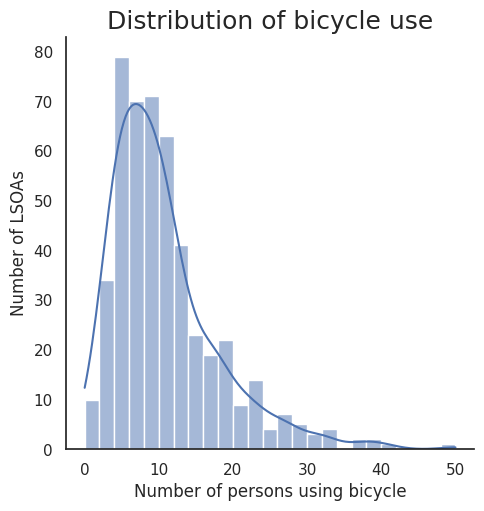

In [9]:
# GRAPH TO SHOW DISTRIBUTION OF DATA
sns.displot(leeds, x='bicycle', kde=True)  #kde = kernel density estimate trend line

# set title
plt.title('Distribution of bicycle use', fontsize=18)

# set axis labels
plt.xlabel('Number of persons using bicycle')
plt.ylabel('Number of LSOAs')

plt.show()

The above graph displays the distribution of bicycle use.  Analysing the distribution ensures that there are no outliers in the data.  As the count of persons using bicycles per LSOA shows a gradual incline and decline in number of persons, with the most being 6 persons in ~80 LSOAs.

## Non-spatial Data Imports

In [10]:
# Cycle Data (July 2024) [3]
cycle_july = gpd.read_file('/content/CycleData_July2024.csv')
# make columns lower case
cycle_july.columns = cycle_july.columns.str.lower()
#check table has been updated
cycle_july.head()

,sdate,cosit,period,lanenumber,lanedescription,lanedirection,directiondescription,volume,flag text
0,01/07/2024,80474,60,1,Eastbound,1,East,1,Checked
1,01/07/2024,80474,60,2,Westbound,2,West,0,Checked
2,01/07/2024,80474,60,1,Eastbound,1,East,0,Checked
3,01/07/2024,80474,60,2,Westbound,2,West,1,Checked
4,01/07/2024,80474,60,1,Eastbound,1,East,0,Checked


In [11]:
# Cycle Data (December 2024) [4]
cycle_december = gpd.read_file('/content/CycleData_December2024.csv')
# make columns lower case
cycle_december.columns = cycle_december.columns.str.lower()
# check table has been updated
cycle_december.head()

,sdate,cosit,period,lanenumber,lanedescription,lanedirection,directiondescription,volume,flag text
0,01/12/2024 00:00,80474,60,1,Eastbound,1,East,0,Checked
1,01/12/2024 00:00,80474,60,2,Westbound,2,West,0,Checked
2,01/12/2024 01:00,80474,60,1,Eastbound,1,East,1,Checked
3,01/12/2024 01:00,80474,60,2,Westbound,2,West,0,Checked
4,01/12/2024 02:00,80474,60,1,Eastbound,1,East,1,Checked


### Non-spatial Data Distribution

Distribution of July and December (2024) volume of bicycles:

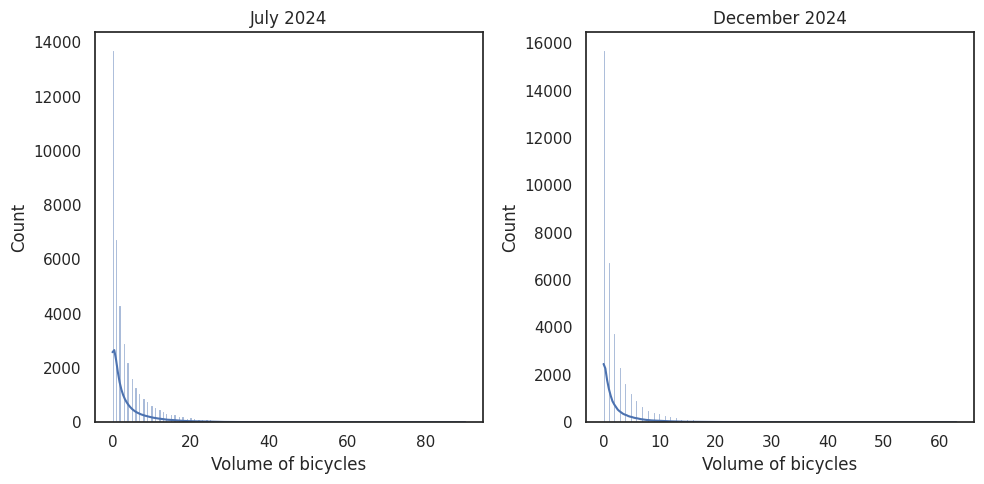

In [48]:
# SCATTER GRAPH TO SHOW DISTRIBUTION

### CO-PILOT ###
# The following prompt was used help generate a horizonal colourbar and title:
# "how to plot both graphs in one output, in same subplot
  # sns.displot(ax[0], cycle_july, x='volume', kde=True)
  # sns.displot(ax[1], cycle_december, x='volume', kde=True)"
# The response generated was used to help write the code below

# set 2 subplots
f,ax = plt.subplots(1,2, figsize=(10,5))

# July plot
sns.histplot(cycle_july, x='volume', kde=True, ax=ax[0])
# set title and axis for July
ax[0].set_title('July 2024')
ax[0].set_xlabel('Volume of bicycles')
ax[0].set_ylabel('Count')


# December plot
sns.histplot(cycle_december, x='volume', kde=True, ax=ax[1])
# set title and axis for December
ax[1].set_title('December 2024')
ax[1].set_xlabel('Volume of bicycles')
ax[1].set_ylabel('Count')


plt.tight_layout()
plt.show()


The data distribution of the volumes of bicycles counted for the months of July and December 2024, show that the largest volume was 0 (~14,000 counts) , and smallest volume being 30 (1 count).  These graphs also show there are no outliers in the data.

### Non-spatial Data Cleaning

In [13]:
# Check what the data types are classed under
cycle_july.dtypes

,0
sdate,object
cosit,object
period,object
lanenumber,object
lanedescription,object
lanedirection,object
directiondescription,object
volume,object
flag text,object


All column data types in the 'cycle_july' and 'cycle_december' dataset are labeled as objects.  To make use of its numeric data, it must be updated from 'object' to 'str'[[5]](https://stackoverflow.com/questions/33957720/how-to-convert-column-with-dtype-as-object-to-string-in-pandas-dataframe) and 'int' [[6]](https://stackoverflow.com/questions/39173813/pandas-convert-dtype-object-to-int)

In [14]:
# update the data types from 'objects' to its numeric form (eg/. 'int', 'string')
cycle_july['cosit']=pd.to_numeric(cycle_july['cosit'])

# change 'object' to string  [5]  df['column'] = df['column'].astype('str')
cycle_july['lanedescription']=cycle_july['lanedescription'].astype('str')
cycle_july['directiondescription']=cycle_july['directiondescription'].astype('str')

# change 'object' to integer  [6]  df['col_name'] = pd.to_numeric(df['col_name'])
cycle_july['volume']=pd.to_numeric(cycle_july['volume'])

# check it has been updated
cycle_july.dtypes



,0
sdate,object
cosit,int64
period,object
lanenumber,object
lanedescription,object
lanedirection,object
directiondescription,object
volume,int64
flag text,object


The date cannot be changed to a string as it will not be able to read-in the date properly.  To achieve this, pd.to_datetime is used.

In [15]:
### CO-PILOT ###
# The following prompt was used in Co-pilot to isolate and join the geometry column with the LSOA data:
# "python, pandas: generate a code using pd.to_datetime(df['col']) to ensure the
  # date is read day-month-year"
# The response generated was used to help write the below code

# change sdate from 'object' to 'date' dtype
cycle_july['sdate']=pd.to_datetime(cycle_july['sdate'],
                                     # make sure it is reading as day/month/year
                                     dayfirst=True)

# Check changes were made
cycle_july.dtypes

,0
sdate,datetime64[ns]
cosit,int64
period,object
lanenumber,object
lanedescription,object
lanedirection,object
directiondescription,object
volume,int64
flag text,object


Check the data types of cycle_december to discern if any need to be updated to either string [[5]](https://stackoverflow.com/questions/33957720/how-to-convert-column-with-dtype-as-object-to-string-in-pandas-dataframe) or integer [[6]](https://stackoverflow.com/questions/39173813/pandas-convert-dtype-object-to-int)

In [16]:
cycle_december.dtypes

,0
sdate,object
cosit,object
period,object
lanenumber,object
lanedescription,object
lanedirection,object
directiondescription,object
volume,object
flag text,object


In [17]:
# update the data types from 'objects' to its numeric form (eg/. 'int', 'string')
cycle_december['cosit']=pd.to_numeric(cycle_december['cosit'])

# change object to string [5]
cycle_december['lanedescription']=cycle_december['lanedescription'].astype('str')
cycle_december['directiondescription']=cycle_december['directiondescription'].astype('str')

# change object to integer
cycle_december['volume']=pd.to_numeric(cycle_december['volume'])

# change sdate from 'object' to 'date' dtype
cycle_december['sdate']=pd.to_datetime(cycle_december['sdate'],
                                     # make sure it is reading as day/month/year
                                     dayfirst=True)
# check it has been updated
cycle_december.dtypes

,0
sdate,datetime64[ns]
cosit,int64
period,object
lanenumber,object
lanedescription,object
lanedirection,object
directiondescription,object
volume,int64
flag text,object


# Final Non-spatial Visualization

The following bar charts show the number of bicycles counted for the entire month of July and December of 2024, noting which direction the bicycles were travelling.  This data was collected from 28 recorders within Leeds - located at different locations for 60 minutes at a time throughout each month [[3]](https://datamillnorth.org/dataset/e1dmk/leeds-annual-cycle-growth) [[4]](https://datamillnorth.org/dataset/e1dmk/leeds-annual-cycle-growth).

The colour palette was set to 'colorblind' to ensure its accessability and readability.  Studies have found that '8% of men have color vision impairment' [[10]](https://www.nceas.ucsb.edu/sites/default/files/2022-06/Colorblind%20Safe%20Color%20Schemes.pdf)

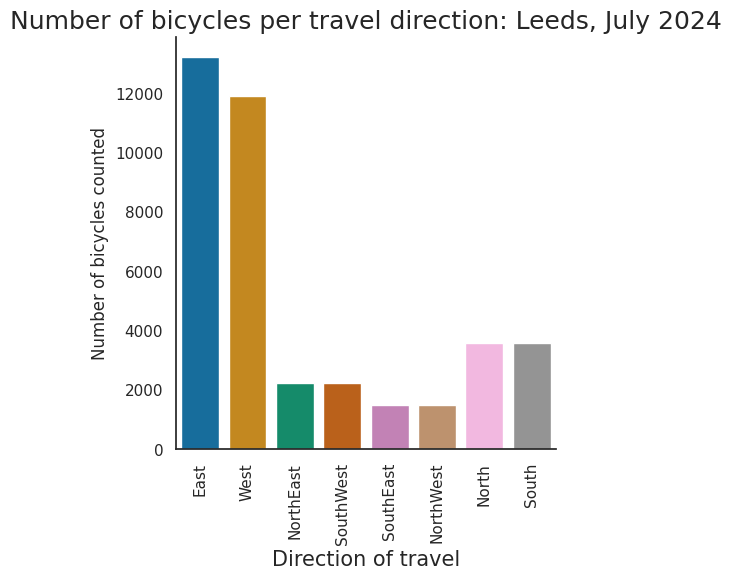

In [18]:
# Number of bicycles per travel direction: Leeds, July 2024

sns.catplot(x='directiondescription', data=cycle_july, kind='count', width=0.8,
            #set colour
            palette='colorblind', hue='directiondescription', legend=False)

#set title and font size
plt.title('Number of bicycles per travel direction: Leeds, July 2024', size=18)

#set axis titles and font size
plt.xlabel('Direction of travel', size=15)
plt.ylabel('Number of bicycles counted', size=12)


#rotate x-axis labels
plt.xticks(rotation=90)

#plot graph
plt.show()

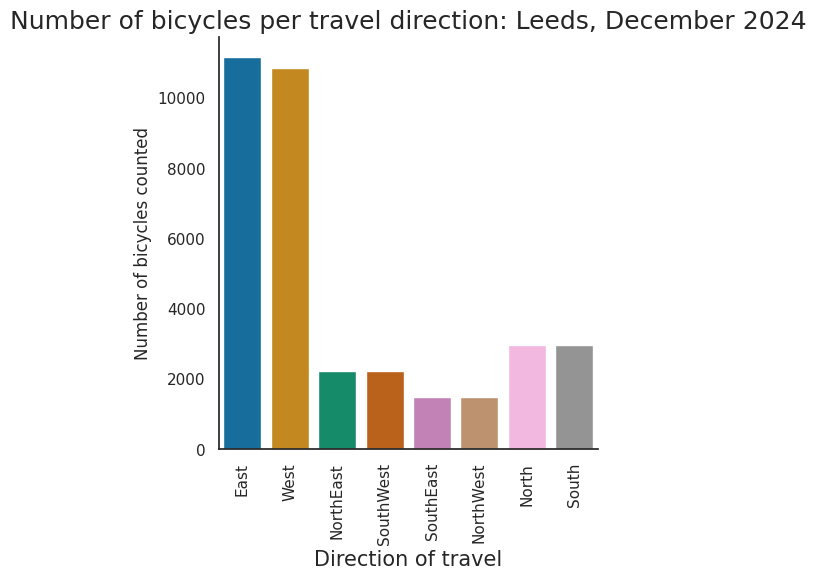

In [19]:
# Number of bicycles per travel direction: Leeds, July 2024

sns.catplot(x='directiondescription', data=cycle_december, kind='count', width=0.8,
            #set colour
            palette='colorblind', hue='directiondescription', legend=False)

#set title and font size
plt.title('Number of bicycles per travel direction: Leeds, December 2024',
          size=18)

#set axis titles and font size
plt.xlabel('Direction of travel', size=15)
plt.ylabel('Number of bicycles counted', size=12)


#rotate x-axis labels
plt.xticks(rotation=90)

#plot graph
plt.show()

The high number of bicycles travelling east and west in both July and December suggest that there are more bicycle lanes and paths accessible leading directly into the city centre.  The low counts of bicycles traveling from the north and south imply that there may be limited bicycle lanes.


Persons may not feel safe enough to travel by bicycle on main roads.  For instance, persons travelling from the north of Leeds have stated concerns about cycle safety, specifically travelling from Hyde Park area to the city centre [[7]](https://www.bbc.co.uk/news/articles/crr9qez28yxo).


Furthermore, persons travelling north may run into more cycle barriers - like bridge crossings [[8]](https://www.yourvoice.westyorks-ca.gov.uk/leeds-ccci).  This may be especially relavent if having to cross over the river.

Determining the highest and lowest direction of travel can shed insight into areas that have the most and least access to bicycle paths/lanes.  Comparing travel directions for both summer and winter months shows a minimal difference in bicycle count for each direction.  This implies that persons travelling by bicycle do so throughout the entirety of the year.  This information can be important to the City - ensuring the upkeep and growth of cycle lanes.

# Statistical Modelling

### Association between chosen variables

In [20]:
# show what each column is named
leeds.columns

Index(['fid_x', 'lsoa21cd', 'lsoa21nm_x', 'lsoa21nmw', 'bng_e_x', 'bng_n_x',
       'lat_x', 'long_x', 'shape__area', 'shape__length', 'globalid',
       'geometry_x', 'fid_y', 'lsoa21nm_y', 'wd24nm', 'bng_e_y', 'bng_n_y',
       'long_y', 'lat_y', 'total_distance_to_work', 'less than 10km',
       '10km to less than 30km', '30km and over', 'works mainly from home',
       'not in employment or works mainly offshore, in no fixed place or outside the uk',
       'work mainly at or from home', 'underground, metro, light rail, tram',
       'train', 'bus, minibus or coach', 'taxi',
       'motorcycle, scooter or moped', 'driving a car or van',
       'passenger in a car or van', 'bicycle', 'on foot',
       'other method of travel to work',
       'not in employment or aged 15 years and under', 'geometry_y'],
      dtype='object')

In [21]:
### CO-PILOT ###
#The following prompt was used in Co-pilot to isolate and join the geometry column with the LSOA data:
# "how to select only certain columns for sns.heatmap(df.corr()"
# The response generated was used to help write the below code

# Select specific columns
selected_columns = ['less than 10km', '10km to less than 30km', '30km and over', 'train', 'bus, minibus or coach', 'bicycle']
leeds_selected = leeds[selected_columns]
leeds_selected.corr()


,less than 10km,10km to less than 30km,30km and over,train,"bus, minibus or coach",bicycle
less than 10km,1.000000,-0.321371,0.166153,0.200806,0.675717,0.453220
10km to less than 30km,-0.321371,1.000000,0.093533,0.092969,-0.401480,-0.213388
30km and over,0.166153,0.093533,1.000000,0.362866,0.160149,0.317967
train,0.200806,0.092969,0.362866,1.000000,0.087042,0.308042
"bus, minibus or coach",0.675717,-0.401480,0.160149,0.087042,1.000000,0.445653
bicycle,0.453220,-0.213388,0.317967,0.308042,0.445653,1.000000


<Axes: >

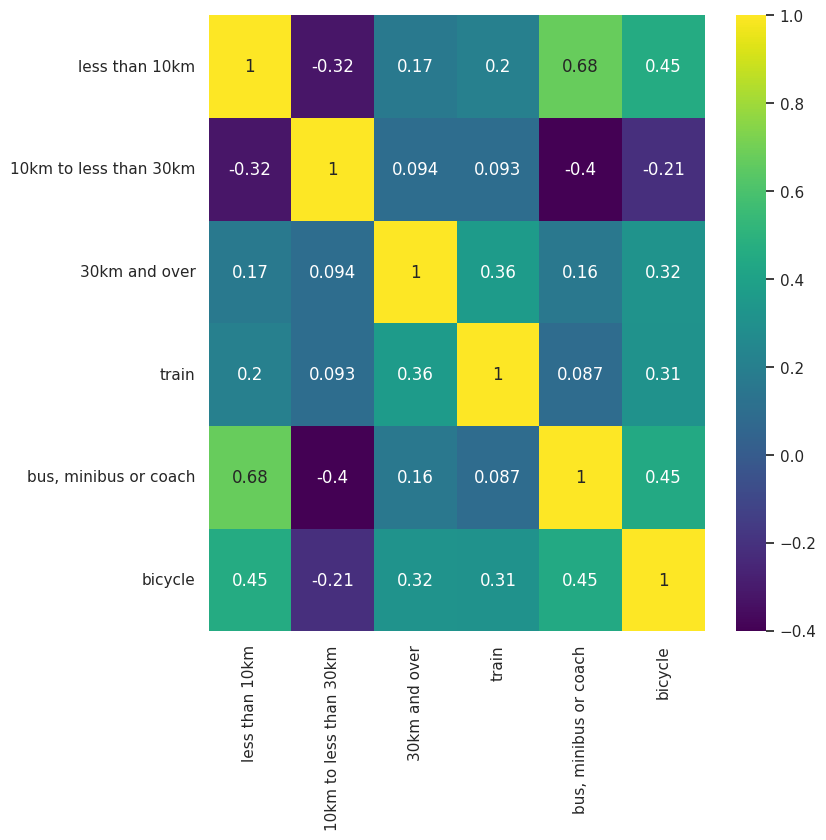

In [22]:
# Create a heatmap of Variable Correlation
plt.figure(figsize=(8,8))
sns.heatmap(leeds_selected.corr(), annot=True,
            # Viridis colour scheme used to ensure accessibility to those who may be colour blind
            cmap='viridis')

The modes of transport chosen were those deemed to be either public or active.  Although 'underground, metro, light rail, tram' is a form of public transport, it is not present in Leeds so was left out of the correlation matrix.

The use of 'bus, minibus or coach' has the highest correlation of 0.68 when living 10km or less to work.  Using a bicycle when traveling less than 10km to work has a correlation of 0.45.  Interestingly, traveling by bicycle 30km or more has a higher correlation (0.32) than traveling 10-30km (-0.21).

The viridis colour scheme was used the as it 'includes eight
perceptually uniform color blind tested options' [[10]](https://www.nceas.ucsb.edu/sites/default/files/2022-06/Colorblind%20Safe%20Color%20Schemes.pdf)

# Spatial Visualization

### Making use of gemoetry

In [23]:
# Ensure it is saved as a GeoDataFrame (to make use of the geometry)
leeds = gpd.GeoDataFrame(leeds)

When merging the 'lsoa_data' and 'travel' data, two columns of geometry were made ('geometry_x' and 'geometry_y').  When mapping, the geometry can only be called from the column labeled 'geometry' only.  The following process changes the name of 'geometry_x' to 'geometry'.

In [24]:
# change name of 'geometry_x' to 'geometry'
leeds.rename(columns={'geometry_x' : 'geometry'}, inplace=True)

# check changes were made
leeds.columns

Index(['fid_x', 'lsoa21cd', 'lsoa21nm_x', 'lsoa21nmw', 'bng_e_x', 'bng_n_x',
       'lat_x', 'long_x', 'shape__area', 'shape__length', 'globalid',
       'geometry', 'fid_y', 'lsoa21nm_y', 'wd24nm', 'bng_e_y', 'bng_n_y',
       'long_y', 'lat_y', 'total_distance_to_work', 'less than 10km',
       '10km to less than 30km', '30km and over', 'works mainly from home',
       'not in employment or works mainly offshore, in no fixed place or outside the uk',
       'work mainly at or from home', 'underground, metro, light rail, tram',
       'train', 'bus, minibus or coach', 'taxi',
       'motorcycle, scooter or moped', 'driving a car or van',
       'passenger in a car or van', 'bicycle', 'on foot',
       'other method of travel to work',
       'not in employment or aged 15 years and under', 'geometry_y'],
      dtype='object')

### Mapping Bicycle Use

The map below shows overall bicycle use travelling to work in Leeds per LSOA.  The closer to the city centre, the higher amount of bicycle use to get to work.  Areas on the outskirts of Leeds show very low numbers of bicycle use.

The following maps use the viridis colour scheme was used to ensure colour blind accessability [[10]](https://www.nceas.ucsb.edu/sites/default/files/2022-06/Colorblind%20Safe%20Color%20Schemes.pdf)

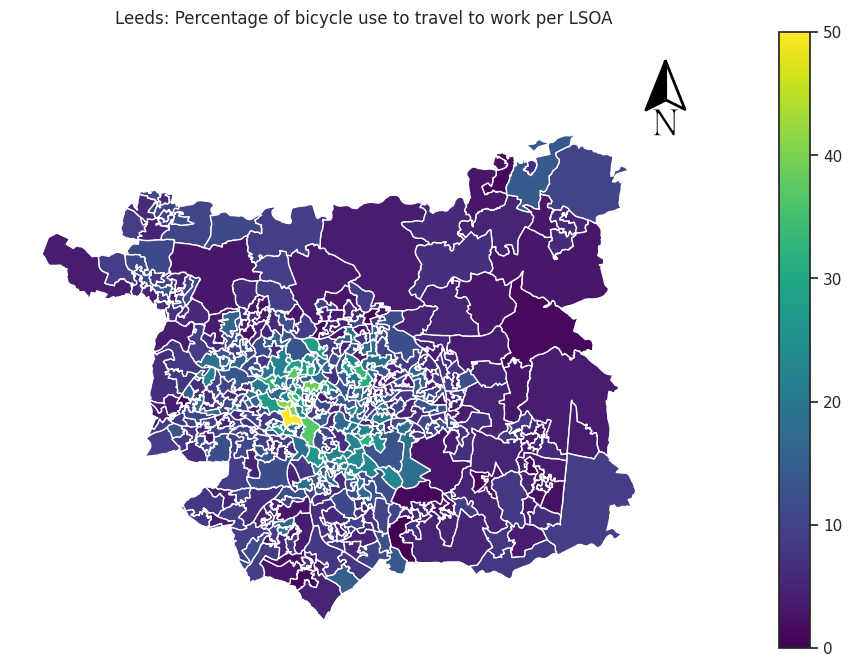

In [25]:
# create a map showing the distribution of bicycle use
f,ax = plt.subplots(1, figsize=(16,8))

leeds.plot(ax=ax, column='bicycle', legend=True, cmap='viridis').set(
    title='Leeds: Percentage of bicycle use to travel to work per LSOA')

#cbar.set_label('Percentage of Bicycle Commuters')

# add north arrow [9]  add_north_arrow(ax, scale=.75, xlim_pos=.9025, ylim_pos=.965, color='#000', text_scaler=4, text_yT=-1.25)
add_north_arrow(ax, scale=.75, xlim_pos=1, ylim_pos=1, color='#000', text_scaler=4, text_yT=-1.25)

# make axis invisible
ax.set_axis_off()
plt.show()

# Final Spatial Visualization:

As noted in the variable correlation heatmap, using a bicycle is correlated to distance travlled to work.


Correlation Values:
*   Bicycle + less than 10km travel = 0.45
*   Bicycle + 10-30km = -0.21
* Bicycle + more than 30km = 0.32



The follow maps show the trends between the 3 distance variables compared to
bicycle use.

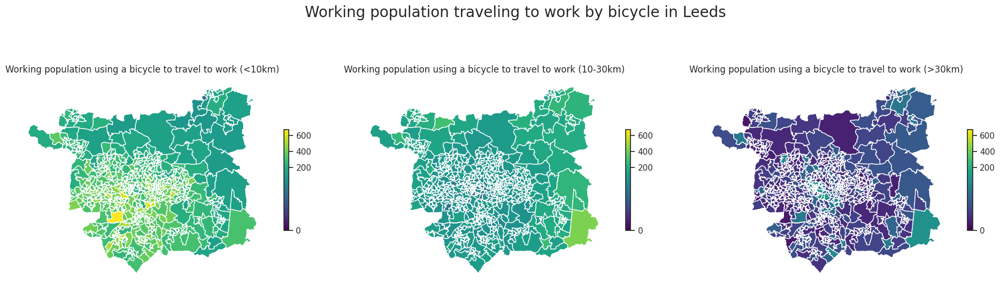

In [40]:
# Leeds - distance variables   [11]

# create subplots:
f,ax = plt.subplots(1,3, figsize=(20,7))

# define min & max limits of cbar
#min
vmin=0
# determine max value
vmax = travel[['less than 10km', '10km to less than 30km', '30km and over', 'bicycle']].max().max()
# use the maximum bicycle value (the smaller of the two counts) as the midpoint of the colorbar
vcenter= travel['bicycle'].max()

# create normalization
from matplotlib import colors
divnorm=colors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

# subplot1: <10km bicycle
travel.plot(
    ax=ax[0], column='less than 10km', legend=True,
    legend_kwds={'shrink':0.4}, norm=divnorm, cmap='viridis')
# title of subplot1
ax[0].set_title('Working population using a bicycle to travel to work (<10km)', fontsize=12)

# subplot2: 10-30km bicycle
travel.plot(
    ax=ax[1], column='10km to less than 30km', legend=True,
    legend_kwds={'shrink':0.4}, norm=divnorm, cmap='viridis')
# title of subplot2
ax[1].set_title('Working population using a bicycle to travel to work (10-30km)', fontsize=12)

# subplot3: >30km
travel.plot(
    ax=ax[2], column='30km and over', legend=True,
    legend_kwds={'shrink':0.4}, norm=divnorm, cmap='viridis')
# title of subplot 3
ax[2].set_title('Working population using a bicycle to travel to work (>30km)', fontsize=12)

# make axis invisible
ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

# add overall title
plt.suptitle('Working population traveling to work by bicycle in Leeds', fontsize=20, y=0.9)


# ensure titles are visible
plt.tight_layout(pad=4.0)  # Increased padding between subplots for better spacing

plt.show()

**The colourbar portrays the 'Number of Bicycle Commuters'**

The three subplot maps of Leeds are very difficult to determine how many people use a bicycle to travel to work per LSOA as the boundaries are very convoluted.  To understand this better, two areas of Leeds were chosen to visualize the difference in distance travelled versus bicycle use.

The two areas are spread around Leeds. Little London and Woodhouse is located centrally, where there is a larger amount of cycle paths.  Otley & Yeadon is located in the north west, where cycling safety has become a concern [[7]](https://www.bbc.co.uk/news/articles/crr9qez28yxo)

The 'travel' dataset is used for further visual analysis, this allows the loc of whole areas listed under 'wd24nm' (eg/. Little London & Woodhouse) instead of determining each individual 'lsoa21nm' code.

In [26]:
# locate LSOAs in the ward ('wd24nm') of 'Little London & Woodhouse'
london_woodhouse = travel.loc[travel['wd24nm']== 'Little London & Woodhouse',:]
# view Little London & Woodhouse dataframe
london_woodhouse

,fid,lsoa21cd,lsoa21nm,wd24nm,bng_e,bng_n,long,lat,total_distance_to_work,less than 10km,...,"bus, minibus or coach",taxi,"motorcycle, scooter or moped",driving a car or van,passenger in a car or van,bicycle,on foot,other method of travel to work,not in employment or aged 15 years and under,geometry
204,10924,E01011481,Leeds 056C,Little London & Woodhouse,428010,434623,-1.57615,53.80716,1812,315,...,75,20,3,183,23,28,127,16,1042,"POLYGON ((427859.313 435219, 427866.3 435210.7..."
206,10926,E01011483,Leeds 056E,Little London & Woodhouse,427812,434408,-1.57917,53.80524,1623,305,...,88,19,4,153,17,21,130,12,971,"POLYGON ((427689.918 434721.325, 427689.994 43..."
376,11096,E01011670,Leeds 055A,Little London & Woodhouse,429805,435408,-1.54881,53.81412,2612,364,...,94,34,1,196,31,14,138,20,1917,"POLYGON ((430000.094 435697.906, 430007.063 43..."
377,11097,E01011671,Leeds 055B,Little London & Woodhouse,430252,434982,-1.54207,53.81026,1687,297,...,69,32,0,171,18,13,113,10,1150,"POLYGON ((430122 435359, 430130.676 435339.721..."
380,11100,E01011678,Leeds 063B,Little London & Woodhouse,428949,433981,-1.56195,53.80134,4345,440,...,105,36,0,196,38,16,269,13,3316,"POLYGON ((429453.203 434364.887, 429456.582 43..."
381,11101,E01011681,Leeds 063D,Little London & Woodhouse,428547,434325,-1.56802,53.80446,1692,291,...,72,13,2,144,22,9,108,7,1181,"POLYGON ((428670.434 434794.827, 428694.235 43..."
460,31259,E01033002,Leeds 055F,Little London & Woodhouse,430405,434292,-1.53981,53.80405,2177,365,...,71,12,1,181,16,8,231,9,1259,"POLYGON ((430414.904 434816.575, 430445.719 43..."
461,31260,E01033003,Leeds 055G,Little London & Woodhouse,430727,434411,-1.53491,53.80510,2293,458,...,140,26,4,204,18,23,249,13,1340,"POLYGON ((431115.233 434630.985, 431075 434576..."
462,31261,E01033008,Leeds 111A,Little London & Woodhouse,429483,433792,-1.55386,53.79961,2150,218,...,36,14,0,85,15,6,147,8,1521,"POLYGON ((429927 434278, 429924 434266, 429921..."
463,31262,E01033010,Leeds 111B,Little London & Woodhouse,430272,433829,-1.54188,53.79990,3485,305,...,56,26,2,114,20,17,213,5,2701,"POLYGON ((430324.094 434257.094, 430336.594 43..."


In [27]:
# Explore where the area is located and features within in
london_woodhouse.explore()

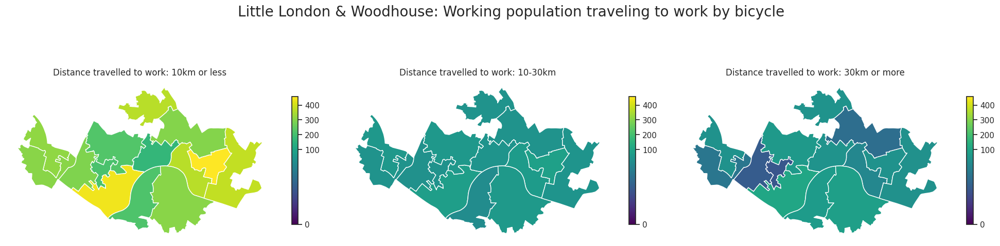

In [42]:
# Little London & Woodhouse (central)     [11]
# create subplots:
f,ax = plt.subplots(1,3, figsize=(20,7))

# define min & max limits of cbar
#min
vmin=0
# determine max value
vmax = london_woodhouse[['less than 10km', '10km to less than 30km', '30km and over', 'bicycle']].max().max()
# use the maximum bicycle value (the smaller of the two counts) as the midpoint of the colorbar
vcenter=london_woodhouse['bicycle'].max()

# create normalization
from matplotlib import colors
divnorm=colors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)


# subplot1: <10km bicycle
london_woodhouse.plot(
    ax=ax[0], column='less than 10km',
    norm=divnorm, cmap='viridis',
    legend=True, legend_kwds={'shrink': 0.4})
# title of subplot1
ax[0].set_title('Distance travelled to work: 10km or less', fontsize=12)


# subplot2: 10-30km bicycle
london_woodhouse.plot(
    ax=ax[1], column='10km to less than 30km',
    norm=divnorm, cmap='viridis',
    legend=True, legend_kwds={'shrink': 0.4})
# title of subplot2
ax[1].set_title('Distance travelled to work: 10-30km', fontsize=12)

# subplot3: >30km
london_woodhouse.plot(
    ax=ax[2], column='30km and over',
    norm=divnorm, cmap='viridis',
    legend=True, legend_kwds={'shrink': 0.4})
# title of subplot 3
ax[2].set_title('Distance travelled to work: 30km or more', fontsize=12)

# make axis invisible
ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()



# add overall title
plt.suptitle('Little London & Woodhouse: Working population traveling to work by bicycle', fontsize=20, y=0.9)


# increased padding between subplots for better spacing of maps
plt.tight_layout(pad=1)

# plot
plt.show()

**The colourbar portrays the 'Number of Bicycle Commuters'**

Little London & Woodhouse is situated around the University of Leeds, comprising of a large student population.  Although bicycles may be used to travel to and from the university, many students may not be employed so their bicycle use will not be included in this data set.

Travelling 10km or less to work yeilds the highest number of persons using a bicycle, with the majority of the highlighted LSOAs being between 300-200 persons.  Travelling 10-30km and 30lm plus to work does not seem to hold much difference in number of persons using a bicycle; with 30km plus having LSOAs with below 50 persons.

In [29]:
# locate LSOAs in the ward ('WD24NM') of 'Otley & Yeadon'
otley_yeadon = travel.loc[travel['wd24nm']== 'Otley & Yeadon',:]
# view Little Otley & Yeadon dataframe
otley_yeadon

,fid,lsoa21cd,lsoa21nm,wd24nm,bng_e,bng_n,long,lat,total_distance_to_work,less than 10km,...,"bus, minibus or coach",taxi,"motorcycle, scooter or moped",driving a car or van,passenger in a car or van,bicycle,on foot,other method of travel to work,not in employment or aged 15 years and under,geometry
0,10720,E01011264,Leeds 011A,Otley & Yeadon,420937,441836,-1.68306,53.87232,1284,200,...,25,2,1,312,23,5,45,6,703,"POLYGON ((421248.688 442315.812, 421284.072 44..."
4,10724,E01011268,Leeds 010A,Otley & Yeadon,420224,441935,-1.69390,53.87324,1401,278,...,35,8,1,316,36,10,99,2,757,"POLYGON ((420442.406 442436.687, 420443.313 44..."
5,10725,E01011269,Leeds 011B,Otley & Yeadon,421526,441584,-1.67412,53.87003,1569,290,...,29,3,4,410,33,9,81,8,802,"POLYGON ((421777.841 441741.448, 421695.906 44..."
10,10730,E01011274,Leeds 010C,Otley & Yeadon,420756,440751,-1.68589,53.86258,1361,243,...,28,10,2,266,23,4,112,1,769,"POLYGON ((421166.053 441239.57, 421170.415 441..."
12,10732,E01011276,Leeds 011C,Otley & Yeadon,420972,440891,-1.68259,53.86383,1734,276,...,21,3,2,465,20,11,54,10,811,"POLYGON ((421185.054 441100.62, 421200.25 4410..."
280,11000,E01011569,Leeds 004A,Otley & Yeadon,422246,445045,-1.66292,53.90111,1731,181,...,42,1,1,328,16,10,97,4,887,"POLYGON ((422941.192 446149.652, 422943 446135..."
282,11002,E01011571,Leeds 004B,Otley & Yeadon,419734,444758,-1.70117,53.89863,1610,180,...,22,2,4,339,21,5,69,6,825,"POLYGON ((419195 445143, 419196.395 445142.768..."
283,11003,E01011572,Leeds 004C,Otley & Yeadon,421088,445367,-1.68052,53.90405,1776,213,...,42,3,0,412,24,12,103,4,855,"POLYGON ((420944.316 445703.131, 420946.912 44..."
284,11004,E01011573,Leeds 004D,Otley & Yeadon,418428,445005,-1.72103,53.90090,1304,203,...,13,4,3,338,30,9,32,1,677,"POLYGON ((418848 445199.046, 418865.905 445135..."
285,11005,E01011574,Leeds 004E,Otley & Yeadon,419974,445285,-1.69748,53.90336,1395,134,...,17,1,2,231,7,9,71,6,825,"POLYGON ((420498.502 445636.129, 420499 445635..."


In [30]:
# Explore the Otley & Yeadon area
otley_yeadon.explore()

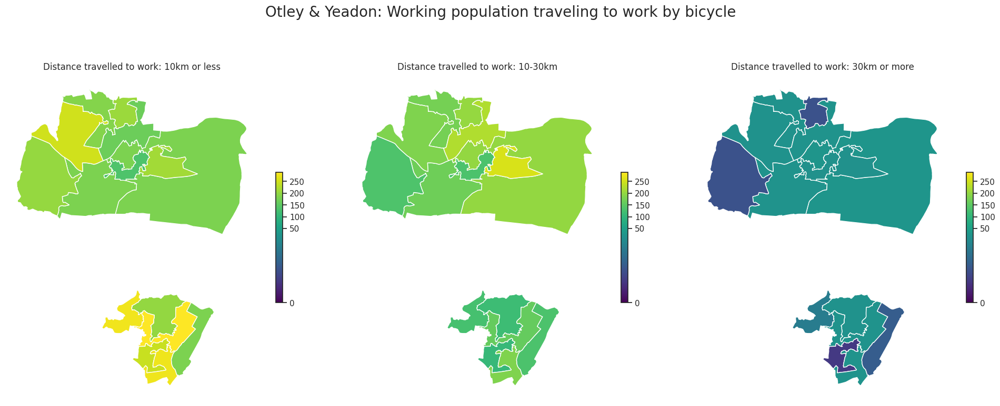

In [31]:
# Otley & Yeadon (north west of Leeds)     [11]
# create subplots:
f,ax = plt.subplots(1,3, figsize=(20,7))

# define min & max limits of cbar
#min
vmin=0
# determine max value
vmax = otley_yeadon[['less than 10km', '10km to less than 30km', '30km and over', 'bicycle']].max().max()
# use the maximum bicycle value (the smaller of the two counts) as the midpoint of the colorbar
vcenter=otley_yeadon['bicycle'].max()

# create normalization
from matplotlib import colors
divnorm=colors.TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)

# subplot1: <10km bicycle
otley_yeadon.plot(
    ax=ax[0], column='less than 10km',
    norm=divnorm, cmap='viridis',
    legend=True, legend_kwds={'shrink': 0.4})
# title of subplot1
ax[0].set_title('Distance travelled to work: 10km or less', fontsize=12)

# subplot2: 10-30km bicycle
otley_yeadon.plot(
    ax=ax[1], column='10km to less than 30km',
    norm=divnorm, cmap='viridis',
    legend=True, legend_kwds={'shrink': 0.4})
# title of subplot2
ax[1].set_title('Distance travelled to work: 10-30km', fontsize=12)

# subplot3: >30km
otley_yeadon.plot(
    ax=ax[2], column='30km and over',
    norm=divnorm, cmap='viridis',
    legend=True, legend_kwds={'shrink': 0.4})

# title of subplot 3
ax[2].set_title('Distance travelled to work: 30km or more', fontsize=12)

# make axis invisible
ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()


# add overall title
plt.suptitle('Otley & Yeadon: Working population traveling to work by bicycle', fontsize=20, y=1.1)

# increased padding between subplots for better spacing of maps
plt.tight_layout(pad=1)

# plot
plt.show()

**The colourbar portrays the 'Number of Bicycle Commuters'**

Otley & Yeadon portray a large majority of LSOAs in the area have 150-300 persons using a bicycle to travel to work for both less than 10km and 10-30km.  There is a drastic decline in bicycle use when persons must travel 30km plus.

# Conclusion

Living closer to the city centre boasts more access to cycle lanes and paths, as well as a shorter distance to travel to work.  Travelling 10km or less is correlated with using a bicycle for transportation.  The further away from the city centre, the more safety concerns about bicycle and road safety.  With better access links to bike paths, there may be an increase in bicycle use for distances from 10-30km.  More accessible bicycle lanes should be added traveling north to south.

## References
Leeds LSOA boundary data [[1]](https://geoportal.statistics.gov.uk/datasets/ons::lower-layer-super-output-areas-december-2021-boundaries-ew-bfc-v10-2/about)

Method used to travel to work [[2]](notebooks/Week_6_Python_as_a_GIS.ipynb)

Cycle data - July 2024 [[3]](https://datamillnorth.org/dataset/e1dmk/leeds-annual-cycle-growth)

Cycle data - December 2024 [[4]](https://datamillnorth.org/dataset/e1dmk/leeds-annual-cycle-growth)

Changing data type from object to string value [[5]](https://stackoverflow.com/questions/39173813/pandas-convert-dtype-object-to-int)

Changing data type from object to integer value [[6]](https://stackoverflow.com/questions/33957720/how-to-convert-column-with-dtype-as-object-to-string-in-pandas-dataframe)

Cycle route linking city universities unveiled [[7]](https://www.bbc.co.uk/news/articles/crr9qez28yxo)

Leeds City Centre Cycle Improvements [[8]](https://www.yourvoice.westyorks-ca.gov.uk/leeds-ccci)

How to add a north-arrow [[9]](https://stackoverflow.com/questions/58088841/how-to-add-a-north-arrow-on-a-geopandas-map)

Colourblind safe colour schemes [[10]](https://www.nceas.ucsb.edu/sites/default/files/2022-06/Colorblind%20Safe%20Color%20Schemes.pdf)


Normalizing data & creating multiple subplots [[11]](notebooks/Week_6_Python_as_a_GIS.ipynb)

# Acknowledgements

**I acknowlege the use of Co-pilot AI** (Mircosoft, https://copilot.microsoft.com/chats/LTPVymuDAUXi2BxbMMYFC) to provide assitance on generating codes with the following prompts.

Prompt: "how to plot both graphs in one output, in same subplot
  sns.displot(ax[0], cycle_july, x='volume', kde=True)
  sns.displot(ax[1], cycle_december, x='volume', kde=True)"


Prompt: "python, pandas: generate a code using pd.to_datetime(df['col']) to ensure the date is read day-month-year"


Prompt: "how to select only certain columns for sns.heatmap(df.corr()"